In [1]:
import os
import tensorflow as tf
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from datetime import datetime

2024-07-20 19:50:20.735006: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Ensure GPU is used
physical_devices = tf.config.list_physical_devices('GPU')
print('GPUs: ',physical_devices)

physical_devices = tf.config.list_physical_devices('CPU')
print('CPUs: ',physical_devices)

GPUs:  []
CPUs:  [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


# Define a simple U-Net image segmentation model

In [3]:
def conv_block(x, n_filters):
    """Two convolutions"""
    x = Conv2D(n_filters, (3, 3), padding='same', activation='relu')(x)
    x = Conv2D(n_filters, (3, 3), padding='same', activation='relu')(x)
    return x
    
def encoder_block(x, n_filters):
    """Conv block and max pooling"""
    x = conv_block(x, n_filters)
    p = MaxPooling2D((2, 2))(x)
    return x, p  # We will need x for the skip connections later

def decoder_block(x, p, n_filters):
    """Upsample, skip connection, and conv block"""
    x = Conv2DTranspose(n_filters, (2, 2), strides=(2, 2), padding='same')(x)
    x = concatenate([x, p])  # Concatenate = skip connection
    x = conv_block(x, n_filters)
    return x

def unet_model(img_height, img_width, img_channels):
    inputs = Input((img_height, img_width, img_channels))  # 512x512x3
    
    # Contraction path, encoder
    c1, p1 = encoder_block(inputs, n_filters=64)  # c1=512x512x64 p1=256x256x64
    c2, p2 = encoder_block(p1, n_filters=128)  # c2=256x256x128 p2=128x128x128
    c3, p3 = encoder_block(p2, n_filters=256)  # c3=128x128x256 p3=64x64x256
    c4, p4 = encoder_block(p3, n_filters=512)  # c4=64x64x512 p4=32x32x512

    # Bottleneck
    bridge = conv_block(p4, n_filters=1024)  # bridge=32x32x1024
    
    # Expansive path, decoder
    u4 = decoder_block(bridge, c4, n_filters=512)  # 64x64x512
    u3 = decoder_block(u4, c3, n_filters=256)  # 128x128x256
    u2 = decoder_block(u3, c2, n_filters=128)  # 256x256x128
    u1 = decoder_block(u2, c1, n_filters=64)  # 512x512x64

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(u1)  # 512x512x1

    model = Model(inputs=[inputs], outputs=[outputs])

    return model

In [10]:
# Define Focal Binary Cross-Entropy Loss
def focal_binary_crossentropy(y_true, y_pred, gamma=2., alpha=0.25):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    epsilon = tf.keras.backend.epsilon()
    
    y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
    y_true = tf.clip_by_value(y_true, epsilon, 1. - epsilon)

    cross_entropy = -y_true * tf.math.log(y_pred)
    loss = alpha * tf.math.pow(1 - y_pred, gamma) * cross_entropy
    return tf.reduce_mean(loss)

def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    focal = focal_binary_crossentropy(y_true, y_pred)
    return bce + focal

def dice_coefficient(y_true, y_pred):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + tf.keras.backend.epsilon()) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + tf.keras.backend.epsilon())

In [21]:
# Instantiate and compile the model with an initial learning rate
initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)

# model = unet_model(img_height=512, img_width=512, img_channels=16)
model.compile(optimizer=optimizer, loss=combined_loss, metrics=[dice_coefficient])

In [22]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                6)]                                                               
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  9280        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

# Data loading process

In [4]:
def load_data(data_folder):
    X_files = sorted([os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.startswith('X_')])
    y_files = sorted([os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.startswith('y_')])
    
    X_data = []
    y_data = []
    
    for X_file, y_file in tqdm(zip(X_files, y_files), total=len(X_files)):
        X_data.append(np.load(X_file))
        y_data.append(np.load(y_file))
    
    X_data = np.array(X_data)
    y_data = np.array(y_data)
    
    return X_data, y_data

In [5]:
data_folder = '/home/ayadav7/downscaled_data'
X, y = load_data(data_folder)
print(f"Loaded X data shape: {X.shape}")
print(f"Loaded y data shape: {y.shape}")

100%|██████████| 1420/1420 [01:50<00:00, 12.90it/s]


Loaded X data shape: (1420, 512, 512, 16)
Loaded y data shape: (1420, 512, 512)


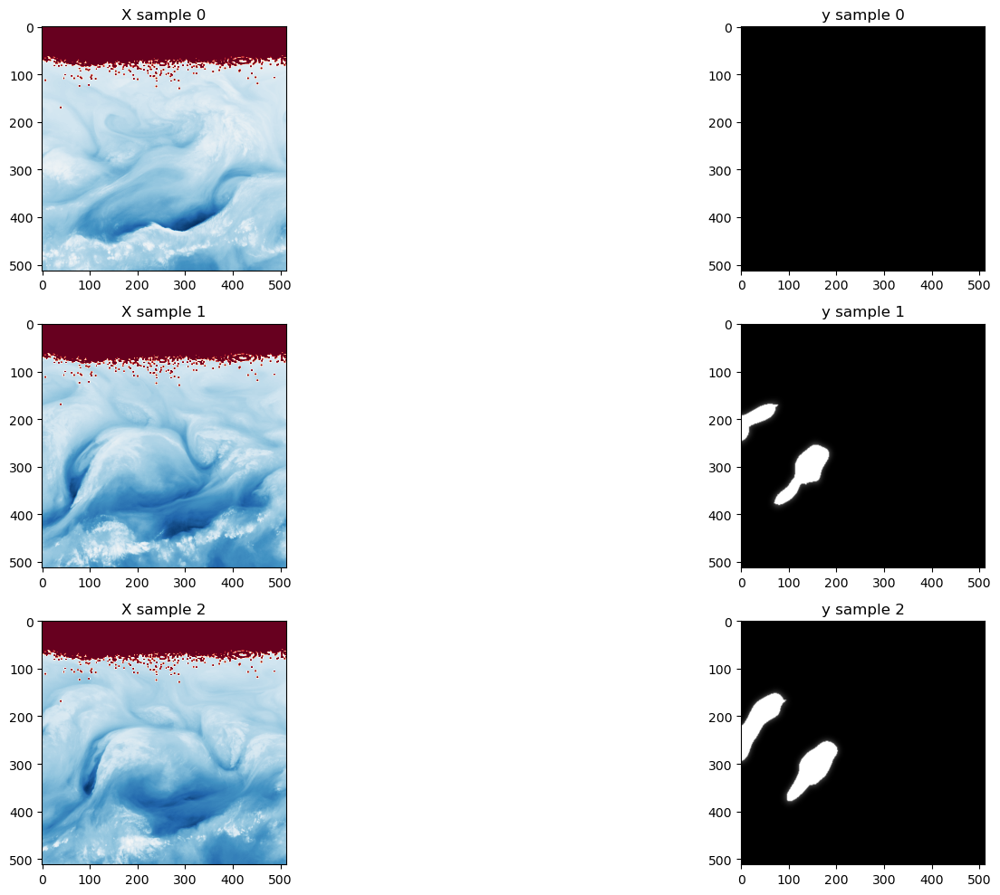

In [6]:
# Plot some samples from the dataset
def plot_samples(X, y, num_samples=3):
    fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4))
    for i in range(num_samples):
        ax = axes[i, 0]
        ax.imshow(X[i][:, :, 7], cmap='RdBu')  # Visualize the first band
        ax.set_title(f"X sample {i}")
        
        ax = axes[i, 1]
        ax.imshow(y[i], cmap='gray')
        ax.set_title(f"y sample {i}")
    plt.tight_layout()
    plt.show()

plot_samples(X, y)

In [57]:
t1 = datetime.now()
indices = np.arange(len(X))
# Train/Validation Split
X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(X, y, indices, test_size=0.2, random_state=42)
print(f"Training data shape: {X_train.shape}, {y_train.shape}")
print(f"Validation data shape: {X_val.shape}, {y_val.shape}")
print('This took {} seconds'.format(datetime.now() - t1))

Training data shape: (1136, 512, 512, 16), (1136, 512, 512)
Validation data shape: (284, 512, 512, 16), (284, 512, 512)
This took 0:00:09.504352 seconds


In [58]:
train_indices

array([ 188,  432,  411, ..., 1294,  860, 1126])

In [8]:
def create_dataset(X, y, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices((X, y))
    dataset = dataset.shuffle(buffer_size=len(X))
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

t1 = datetime.now()
batch_size = 16
train_dataset = create_dataset(X_train, y_train, batch_size)
val_dataset = create_dataset(X_val, y_val, batch_size)
print('This took {} seconds'.format(datetime.now() - t1))

print(f"Training dataset: {train_dataset}")
print(f"Validation dataset: {val_dataset}")

for batch in train_dataset.take(1):
    X_batch, y_batch = batch
    print(f"X_batch shape: {X_batch.shape}")
    print(f"y_batch shape: {y_batch.shape}")

2024-07-20 19:53:20.067293: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


This took 0:00:09.773217 seconds
Training dataset: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 16), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512), dtype=tf.float64, name=None))>
Validation dataset: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 16), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512), dtype=tf.float64, name=None))>
X_batch shape: (16, 512, 512, 16)
y_batch shape: (16, 512, 512)


# Estimate training time

In [13]:
import time

In [15]:
def estimate_training_time(model, train_dataset, batch_size, num_epochs, num_batches=10):
    # Measure the time for a small number of batches
    start_time = time.time()
    model.fit(train_dataset.take(num_batches), epochs=1)
    end_time = time.time()

    # Calculate time per batch
    time_per_batch = (end_time - start_time) / num_batches
    print(f"Time per batch: {time_per_batch:.4f} seconds")

    # Calculate time per epoch
    steps_per_epoch = len(train_dataset) // batch_size
    time_per_epoch = time_per_batch * steps_per_epoch
    print(f"Estimated time per epoch: {time_per_epoch:.2f} seconds")

    # Estimate total training time
    total_training_time = time_per_epoch * num_epochs
    print(f"Estimated total training time: {total_training_time / 3600:.2f} hours")

In [16]:
batch_size = 16  # Adjust based on your resources
num_epochs = 50

# Estimate the training time
estimate_training_time(model, train_dataset, batch_size, num_epochs, 4)

NameError: name 'model' is not defined

# Check the model predictions

In [9]:
model_directory = '/home/ayadav7/models/epoch-20'
model = tf.keras.models.load_model(model_directory, custom_objects={
    'conv_block': conv_block,
    'encoder_block': encoder_block,
    'decoder_block': decoder_block,
    'dice_coefficient': dice_coefficient,
    'combined_loss':combined_loss
})

NameError: name 'dice_coefficient' is not defined

In [ ]:
import random
random.random()

In [38]:
import cv2

def histogram_equalization(matrix):
    # Change -1 values to 0
    matrix[matrix == -1] = 0
    
    # Ensure the matrix values are in the range [0, 1]
    matrix = np.clip(matrix, 0, 1)
    
    # Normalize the matrix to the range [0, 255] for equalization
    normalized_matrix = (matrix * 255).astype(np.uint8)
    
    # Check if the input matrix is three-channel
    if len(normalized_matrix.shape) != 3 or normalized_matrix.shape[2] != 3:
        raise ValueError("Input matrix must be a three-channel (RGB) image.")
    
    # Perform histogram equalization on each channel separately
    equalized_matrix = np.zeros_like(normalized_matrix)
    for i in range(3):
        equalized_matrix[:, :, i] = cv2.equalizeHist(normalized_matrix[:, :, i])
    
    # Convert the equalized matrix back to the range [0, 1]
    equalized_matrix = equalized_matrix.astype(np.float32) / 255.0
    
    return equalized_matrix

In [36]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cartopy.crs as ccrs
import cartopy.feature as cfeature

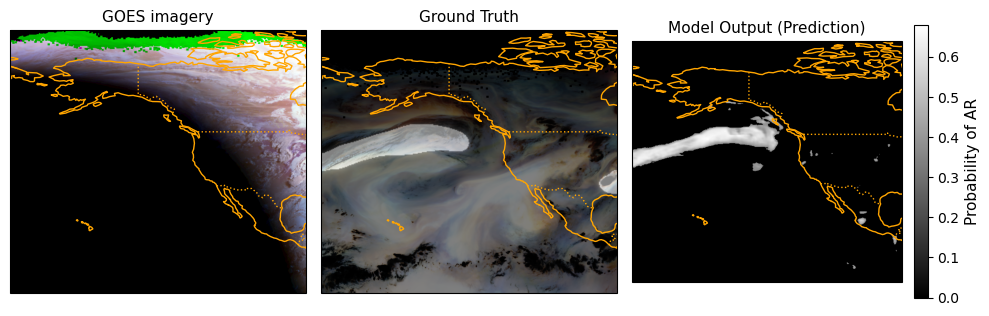

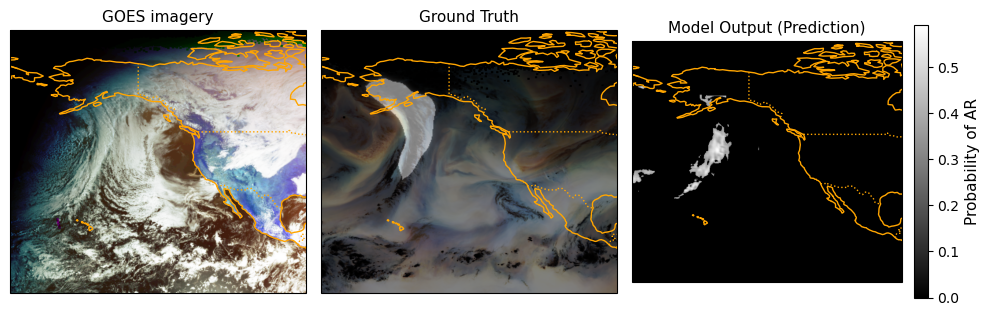

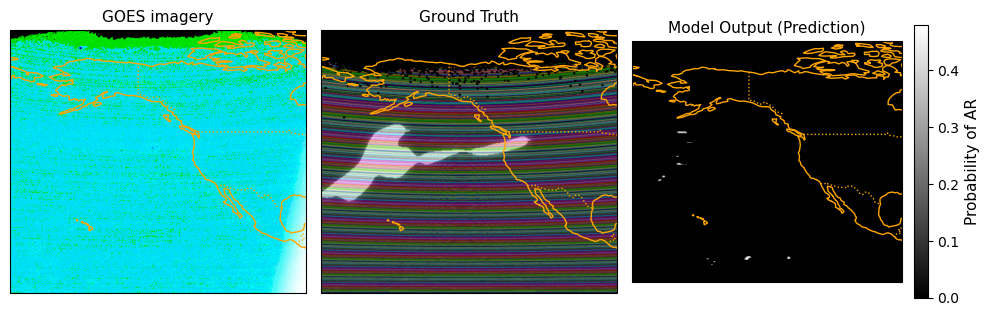

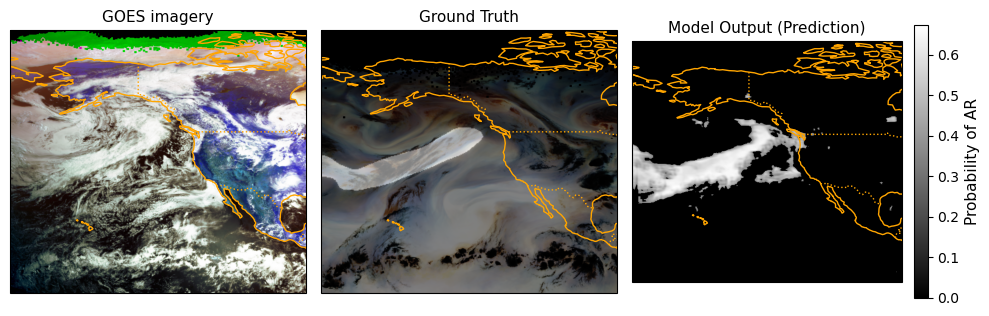

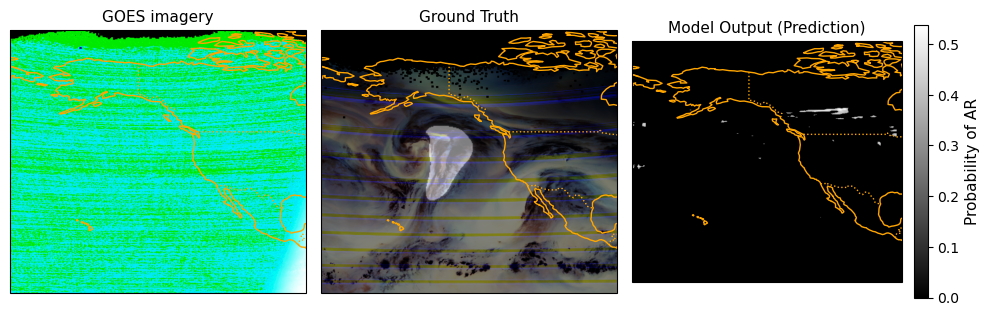

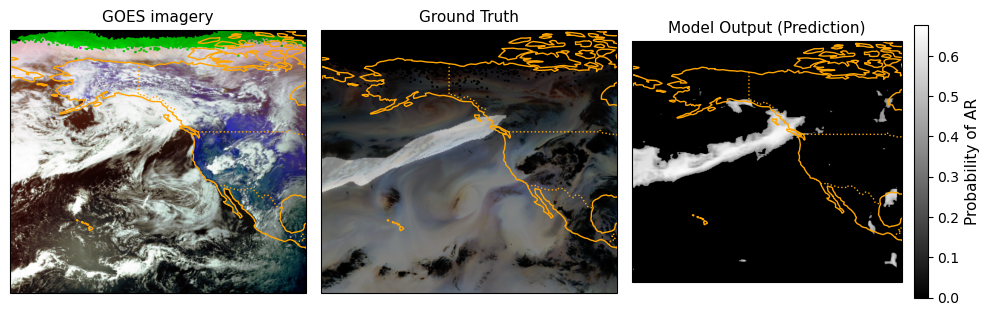

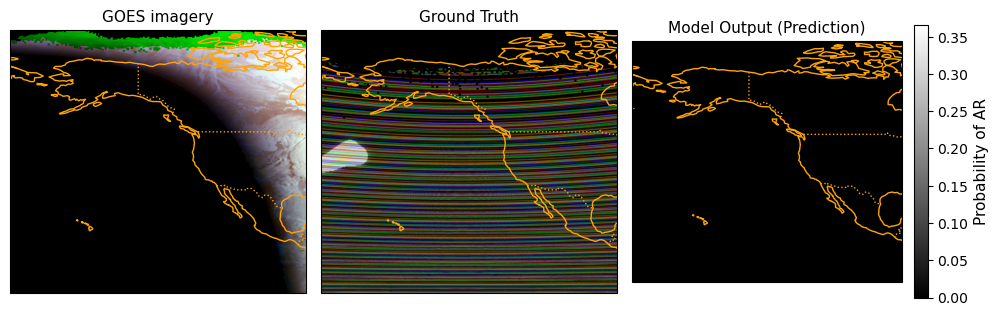

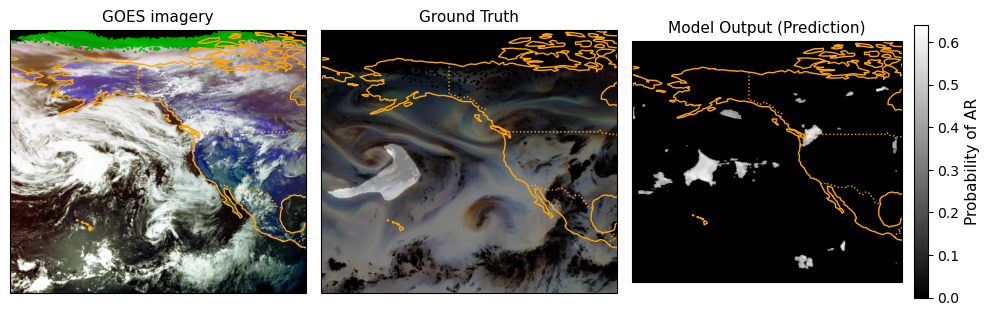

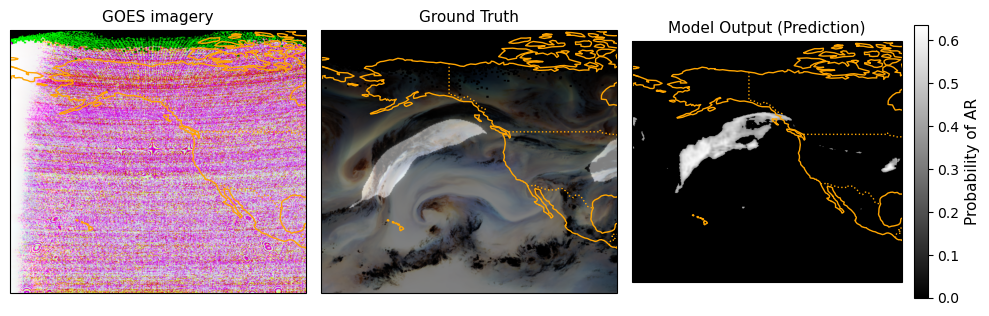

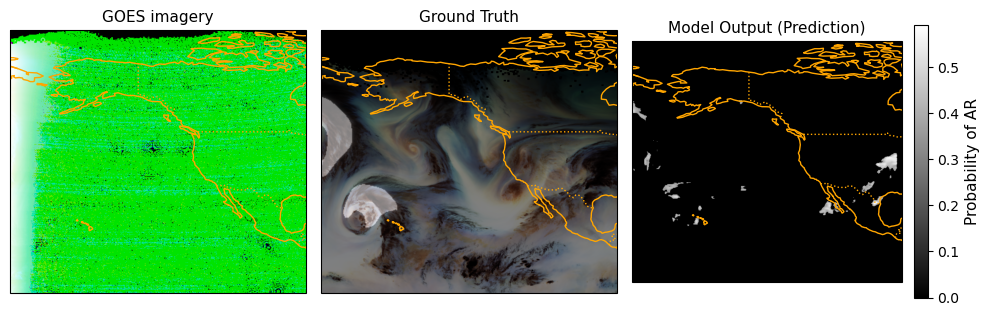

In [72]:
for i in range(10):

    chex = '#FFA500'
    
    # Select one instance from the training dataset
    sample_X = X_train[i:i+1]  # Taking the first sample (batch size of 1)
    sample_y = y_train[i]    # Corresponding ground truth mask
    
    # Get the model's output for this sample
    sample_output = model(sample_X)
    pred = sample_output.numpy()

    fig, axs = plt.subplots(1, 3, figsize=(10, 5), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the first band of the input X matrix
    axs[0].set_title("GOES imagery", fontsize=11)
    im1 = axs[0].imshow(histogram_equalization(sample_X[0, :, :, 0:3]), extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    axs[0].coastlines(color=chex)
    axs[0].add_feature(cfeature.BORDERS, linestyle=':',color=chex)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    
    # Plot the ground truth y matrix
    axs[1].set_title("Ground Truth", fontsize=11)
    im2 = axs[1].imshow(histogram_equalization(sample_X[0, :, :, 7:10]), extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    axs[1].imshow(sample_y, extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray', alpha=0.5)
    axs[1].coastlines(color=chex)
    axs[1].add_feature(cfeature.BORDERS, linestyle=':',color=chex)
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    
    pred[0, :, :, 0][pred[0, :, :, 0] < 0.35] = 0
    
    # Plot the predicted output
    axs[2].set_title("Model Output (Prediction)", fontsize=11)
    im3 = axs[2].imshow(pred[0, :, :, 0], extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    axs[2].coastlines(color=chex)
    axs[2].add_feature(cfeature.BORDERS, linestyle=':', color=chex)
    axs[2].set_xticks([])
    axs[2].set_yticks([])
    
    # Create a colorbar for the last subplot
    cbar = fig.colorbar(im3, ax=axs[2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label('Probability of AR', fontsize=11)
    cbar.ax.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.show()

In [98]:
import matplotlib.patches as mpatches
from matplotlib.text import TextPath
from matplotlib.patches import FancyArrow, PathPatch

/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


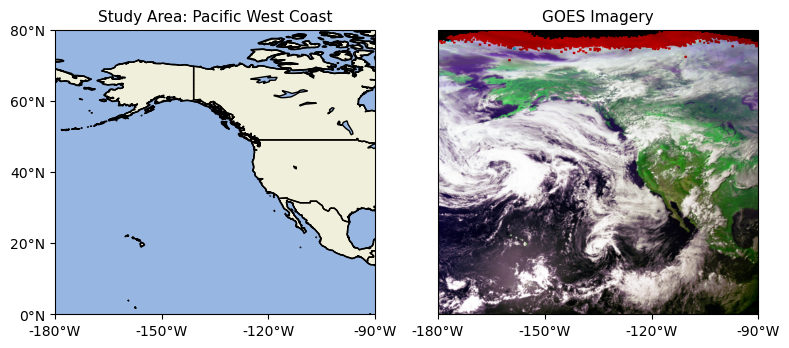

In [107]:
for i in [7]:
    chex = '#FFA500'
    sample_X = X_train[i:i+1]  # Taking the first sample (batch size of 1)
    sample_y = y_train[i]      # Corresponding ground truth mask

    selected_bands = sample_X[:, :, :, [0, 1, 2]]
    rgb_image = selected_bands[:, :, :, [1, 2, 0]]
    
    fig, axs = plt.subplots(1, 2, figsize=(8, 4), subplot_kw={'projection': ccrs.PlateCarree()}, sharey=True)
    
    # Plot the colorful map with landmass, water, and country labels
    axs[0].set_title("Study Area: Pacific West Coast", fontsize=11)
    axs[0].add_feature(cfeature.LAND, edgecolor='black')
    axs[0].add_feature(cfeature.OCEAN)
    axs[0].add_feature(cfeature.COASTLINE)
    axs[0].add_feature(cfeature.BORDERS, linestyle=':', color=chex)
    axs[0].add_feature(cfeature.LAKES, edgecolor='black')
    # axs[0].add_feature(cfeature.RIVERS)
    # axs[0].add_feature(cfeature.STATES, linestyle=':')
    
    # Add country labels
    for country in cfeature.NaturalEarthFeature('cultural', 'admin_0_countries', '50m').geometries():
        axs[0].add_geometries([country], ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    
    axs[0].set_xlim([-180, -90])
    axs[0].set_ylim([0, 80])
    axs[0].set_xticks(np.arange(-180, -90 + 1, 30))
    axs[0].set_yticks(np.arange(0, 80 + 1, 20))
    axs[0].set_xticklabels([f'{x}°W' for x in np.arange(-180, -90 + 1, 30)], fontsize=10)
    axs[0].set_yticklabels([f'{y}°N' for y in np.arange(0, 80 + 1, 20)], fontsize=10)
    
    axs[1].set_title("GOES Imagery", fontsize=11)
    im1 = axs[1].imshow(histogram_equalization(rgb_image[0, :, :, 0:3]), extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    #im1 = axs[1].imshow(rgb_image[0, :, :, 0:3], extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    # axs[1].coastlines(color='black')
    # axs[1].add_feature(cfeature.BORDERS, linestyle=':', color=')
    axs[1].set_xticks(np.arange(-180, -90 + 1, 30))
    # axs[1].set_yticks(np.arange(0, 80 + 1, 20))
    axs[1].set_xticklabels([f'{x}°W' for x in np.arange(-180, -90 + 1, 30)], fontsize=10)
    # axs[1].set_yticklabels([f'{y}°N' for y in np.arange(0, 80 + 1, 20)], fontsize=10)

    plt.tight_layout()
    plt.show()

In [20]:
sample_X = np.load('/home/ayadav7/downscaled_data/X_2018_363_6_g17.nc.npy')
sample_y = np.load('/home/ayadav7/downscaled_data/y_2018_363_6_g17.nc.npy')

sample_X = X[np.newaxis,:,:,:]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


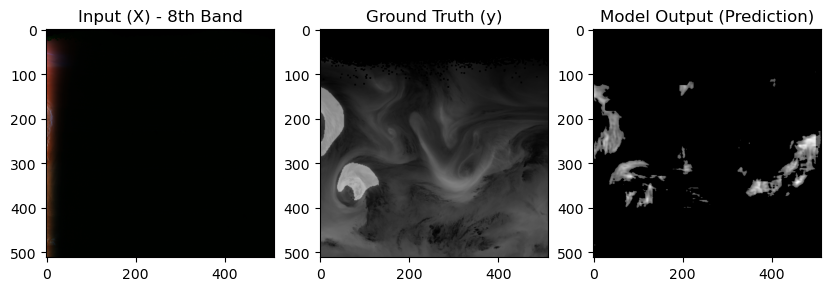

In [71]:
sample_output = model(sample_X)
pred = sample_output.numpy()

# Plot the first band of the input X matrix
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title("Input (X) - 8th Band")
plt.imshow(sample_X[0, :, :, 0:3], cmap='gray')  # Visualizing the first band of the input

# Plot the ground truth y matrix
plt.subplot(1, 3, 2)
plt.title("Ground Truth (y)")
plt.imshow(sample_X[0, :, :, 7], cmap='gray')
plt.imshow(sample_y, cmap='gray',alpha=0.5)

pred[0, :, :, 0][pred[0, :, :, 0]<0.2] = 0

# Plot the predicted output
plt.subplot(1, 3, 3)
plt.title("Model Output (Prediction)")
plt.imshow(pred[0, :, :, 0], cmap='gray')

plt.show()

## Accuracy evaluation metrics

In [19]:
predictions_dir = '/home/ayadav7/data/predictions/u-net/'
os.makedirs(predictions_dir, exist_ok=True)

# Loop over all training samples
for i in tqdm(range(X_train.shape[0])):
    # Select one instance from the training dataset
    sample_X = X_train[i:i+1]
    sample_y = y_train[i]
    
    # Get the model's output for this sample
    pred_y = model_predict(sample_X)
    
    # Save the prediction
    pred_filename = os.path.join(predictions_dir, f'prediction_{i}.npy')
    np.save(pred_filename, pred_y)

    # Save the ground_truth
    gt_filename = os.path.join(predictions_dir, f'ground_truth_{i}.npy')
    np.save(gt_filename, sample_y)

  0%|          | 5/1136 [00:11<43:23,  2.30s/it]  


KeyboardInterrupt: 

In [11]:
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score, accuracy_score

# Placeholder for model prediction function
def model_predict(sample_X):
    return model(sample_X).numpy()  # Assuming model is already defined and trained

# Convert predictions and ground truth masks to binary format
def binarize_mask(mask, threshold=0.35):
    return (mask > threshold).astype(np.uint8)

# Calculate metrics
def calculate_metrics(y_true, y_pred):
    precision = precision_score(y_true.flatten(), y_pred.flatten(), average='binary')
    recall = recall_score(y_true.flatten(), y_pred.flatten(), average='binary')
    f1 = f1_score(y_true.flatten(), y_pred.flatten(), average='binary')
    iou = jaccard_score(y_true.flatten(), y_pred.flatten(), average='binary')
    accuracy = accuracy_score(y_true.flatten(), y_pred.flatten())
    
    intersection = np.sum(y_true.flatten() * y_pred.flatten())
    dice = (2. * intersection) / (np.sum(y_true.flatten()) + np.sum(y_pred.flatten()))
    
    return precision, recall, f1, iou, accuracy, dice


In [12]:
f.split('d')[1]

'iction_0.npy'

In [13]:
from tqdm import tqdm
import os
import numpy as np

# Initialize lists to store metrics for each sample
precisions = []
recalls = []
f1_scores = []
ious = []
accuracies = []
dices = []

data_dir = '/home/ayadav7/data/predictions/u-net'

for f in tqdm(os.listdir(data_dir)):
    if f.startswith('prediction_') and f.endswith('.npy'):
        pred_y = np.load(os.path.join(data_dir, f))
        
        # Extract the date part from the filename
        date_part = f[len('prediction_'):].split('.npy')[0]
        
        # Construct the corresponding ground truth filename
        gt_filename = os.path.join(data_dir, f'ground_truth_{date_part}.npy')
        
        # Check if the ground truth file exists
        if not os.path.exists(gt_filename):
            print(f"Ground truth file not found: {gt_filename}")
            continue

        sample_y = np.load(gt_filename)

        true_mask = binarize_mask(sample_y, threshold=0.5)
        pred_mask = binarize_mask(pred_y, threshold=0.5)
        
        # Calculate metrics for this sample
        precision, recall, f1, iou, accuracy, dice = calculate_metrics(true_mask, pred_mask)
        
        # Append metrics to lists
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1)
        ious.append(iou)
        accuracies.append(accuracy)
        dices.append(dice)


  0%|          | 3/2272 [00:00<07:37,  4.96it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  0%|          | 11/2272 [00:02<06:29,  5.80it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  2%|▏         | 39/2272 [00:06<06:35,  5.65it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set

In [24]:
# Initialize lists to store metrics for each sample
rf_precisions = []
rf_recalls = []
rf_f1_scores = []
rf_ious = []
rf_accuracies = []
rf_dices = []

for f in tqdm(os.listdir('/home/shared/GOES_DA/predicted_data_RF_200')):
    pred_y = np.load(os.path.join('/home/shared/GOES_DA/predicted_data_RF_200',f))
    
    # Load the ground_truth
    gt_filename = os.path.join('/home/ayadav7/downscaled_data', 'y'+f.split('d')[1])
    sample_y = np.load(gt_filename)

    true_mask = binarize_mask(sample_y, threshold=0.5)
    pred_mask = binarize_mask(pred_y, threshold=0.5)
    
    # Calculate metrics for this sample
    precision, recall, f1, iou, accuracy, dice = calculate_metrics(true_mask, pred_mask)
    
    # Append metrics to lists
    rf_precisions.append(precision)
    rf_recalls.append(recall)
    rf_f1_scores.append(f1)
    rf_ious.append(iou)
    rf_accuracies.append(accuracy)
    rf_dices.append(dice)

 20%|██        | 287/1420 [01:25<05:33,  3.40it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 27%|██▋       | 389/1420 [01:55<05:30,  3.12it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 36%|███▋      | 518/1420 [02:34<04:27,  3.38it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to 

In [33]:
from tqdm import tqdm
import os
import numpy as np
# Initialize lists to store metrics for each sample
rf1_precisions = []
rf1_recalls = []
rf1_f1_scores = []
rf1_ious = []
rf1_accuracies = []
rf1_dices = []

for f in tqdm(os.listdir('/home/shared/GOES_DA/preidicted_data_RF_all')):
    pred_y = np.load(os.path.join('/home/shared/GOES_DA/preidicted_data_RF_all',f))
    
    # Load the ground_truth
    gt_filename = os.path.join('/home/ayadav7/downscaled_data', 'y'+f.split('d')[1])
    sample_y = np.load(gt_filename)

    true_mask = binarize_mask(sample_y, threshold=0.5)
    pred_mask = binarize_mask(pred_y, threshold=0.5)
    
    # Calculate metrics for this sample
    precision, recall, f1, iou, accuracy, dice = calculate_metrics(true_mask, pred_mask)
    
    # Append metrics to lists
    rf1_precisions.append(precision)
    rf1_recalls.append(recall)
    rf1_f1_scores.append(f1)
    rf1_ious.append(iou)
    rf1_accuracies.append(accuracy)
    rf1_dices.append(dice)

  0%|          | 0/1420 [00:00<?, ?it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 15%|█▌        | 219/1420 [01:11<06:18,  3.17it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 15%|█▌        | 220/1420 [01:11<06:28,  3.09it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true sa

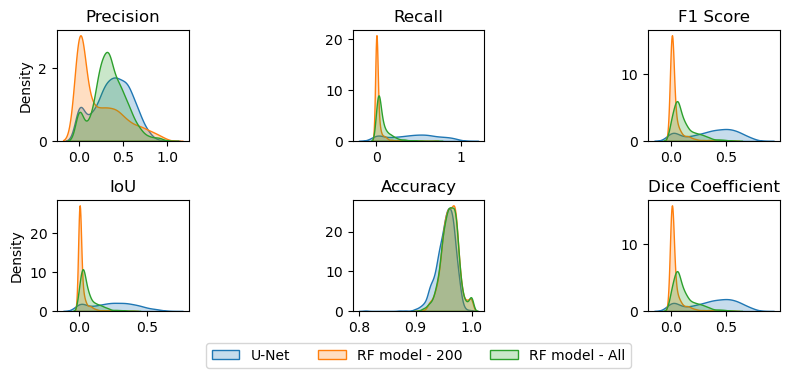

In [227]:
import seaborn as sns

#  Plotting distributions
plt.figure(figsize=(8, 4))

plt.subplot(2, 3, 1)
sns.kdeplot(precisions, fill=True)
sns.kdeplot(rf_precisions, fill=True)
sns.kdeplot(rf1_precisions, fill=True)
plt.title('Precision')

plt.subplot(2, 3, 2)
sns.kdeplot(recalls, fill=True)
sns.kdeplot(rf_recalls, fill=True)
sns.kdeplot(rf1_recalls, fill=True)
plt.title('Recall')
plt.ylabel('')

plt.subplot(2, 3, 3)
sns.kdeplot(f1_scores, fill=True)
sns.kdeplot(rf_f1_scores, fill=True)
sns.kdeplot(rf1_f1_scores, fill=True)
plt.title('F1 Score')
plt.ylabel('')

plt.subplot(2, 3, 4)
sns.kdeplot(ious, fill=True)
sns.kdeplot(rf_ious, fill=True)
sns.kdeplot(rf1_ious, fill=True)
plt.title('IoU')

plt.subplot(2, 3, 5)
sns.kdeplot(accuracies, fill=True, label='U-Net')
sns.kdeplot(rf_accuracies, fill=True, label='RF model - 200')
sns.kdeplot(rf1_accuracies, fill=True, label='RF model - All')
plt.title('Accuracy')
plt.ylabel('')
# Create a single legend
plt.legend(['U-Net', 'RF model - 200', 'RF model - All'], loc='center', bbox_to_anchor=(0.5, -0.4), ncol=3)

plt.subplot(2, 3, 6)
sns.kdeplot(dices, fill=True)
sns.kdeplot(rf_dices, fill=True)
sns.kdeplot(rf1_dices, fill=True)
plt.title('Dice Coefficient')
plt.ylabel('')



plt.tight_layout()
plt.show()

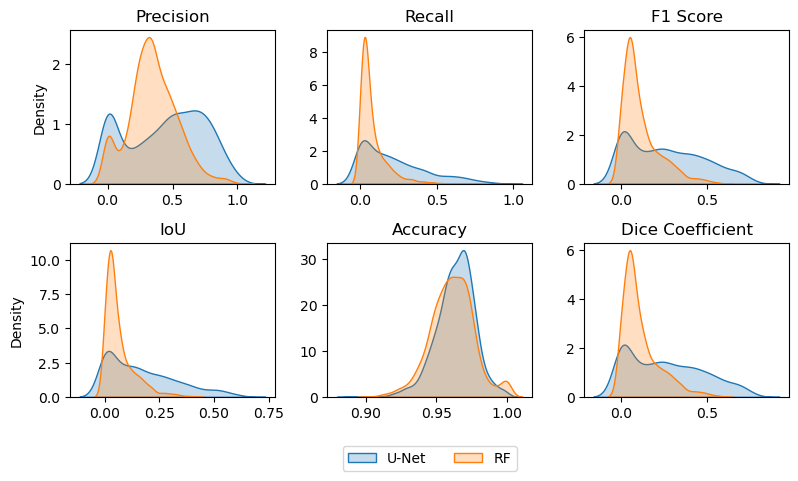

In [42]:
import seaborn as sns

#  Plotting distributions
plt.figure(figsize=(8, 5))

plt.subplot(2, 3, 1)
sns.kdeplot(precisions, fill=True)
#sns.kdeplot(rf_precisions, fill=True)
sns.kdeplot(rf1_precisions, fill=True)
plt.title('Precision')

plt.subplot(2, 3, 2)
sns.kdeplot(recalls, fill=True)
#sns.kdeplot(rf_recalls, fill=True)
sns.kdeplot(rf1_recalls, fill=True)
plt.title('Recall')
plt.ylabel('')

plt.subplot(2, 3, 3)
sns.kdeplot(f1_scores, fill=True)
#sns.kdeplot(rf_f1_scores, fill=True)
sns.kdeplot(rf1_f1_scores, fill=True)
plt.title('F1 Score')
plt.ylabel('')

plt.subplot(2, 3, 4)
sns.kdeplot(ious, fill=True)
#sns.kdeplot(rf_ious, fill=True)
sns.kdeplot(rf1_ious, fill=True)
plt.title('IoU')

plt.subplot(2, 3, 5)
sns.kdeplot(accuracies, fill=True, label='U-Net')
#sns.kdeplot(rf_accuracies, fill=True, label='RF model - 200')
sns.kdeplot(rf1_accuracies, fill=True, label='RF model - All')
plt.title('Accuracy')
plt.ylabel('')
# Create a single legend
plt.legend(['U-Net', 'RF'], loc='center', bbox_to_anchor=(0.5, -0.4), ncol=3)

plt.subplot(2, 3, 6)
sns.kdeplot(dices, fill=True)
#sns.kdeplot(rf_dices, fill=True)
sns.kdeplot(rf1_dices, fill=True)
plt.title('Dice Coefficient')
plt.ylabel('')

plt.tight_layout()
plt.show()

In [ ]:
print(np.mean(precisions))
print(np.mean(recalls))
print(np.mean(rf_f1_scores))
print(np.mean(rf_ious))
print(np.mean(rf_accuracies))
print(np.mean(rf_dices))

In [217]:
print(np.mean(rf_precisions))
print(np.mean(rf_recalls))
print(np.mean(rf_f1_scores))
print(np.mean(rf_ious))
print(np.mean(rf_accuracies))
print(np.mean(rf_dices))

0.23236874979211616
0.024131998129762543
0.035770105642644115
0.01991677634300782
0.9611761576692823
0.035770105642644115


In [43]:
print(np.mean(rf1_precisions))
print(np.mean(rf1_recalls))
print(np.mean(rf1_f1_scores))
print(np.mean(rf1_ious))
print(np.mean(rf1_accuracies))
print(np.nanmean(rf1_dices))

0.3448435641186441
0.07649705628556866
0.11325722538966525
0.06393852039268945
0.960978940507056
0.11365742759952273


In [21]:
predictions_dir = '/home/ayadav7/data/predictions/u-net'

# Initialize lists to store metrics for each sample
precisions = []
recalls = []
f1_scores = []
ious = []
accuracies = []
dices = []

good = []

# Loop over all training samples
for i in tqdm(range(X_train.shape[0])):
# for i in tqdm(range(100)):
    pred_filename = os.path.join(predictions_dir, f'prediction_{i}.npy')
    pred_y = np.load(pred_filename)

    # Save the ground_truth
    gt_filename = os.path.join(predictions_dir, f'ground_truth_{i}.npy')
    sample_y = np.load(gt_filename)

    true_mask = binarize_mask(sample_y, threshold=0.5)
    pred_mask = binarize_mask(pred_y, threshold=0.35)
    
    # Calculate metrics for this sample
    precision, recall, f1, iou, accuracy, dice = calculate_metrics(true_mask, pred_mask)

    if iou>0.5:
        good.append(i)
    
    # Append metrics to lists
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    ious.append(iou)
    accuracies.append(accuracy)
    dices.append(dice)

  4%|▍         | 44/1136 [00:12<05:12,  3.49it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  6%|▌         | 69/1136 [00:19<05:06,  3.48it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 29%|██▉       | 334/1136 [01:35<03:49,  3.49it/s]/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 d

In [22]:
# Calculate average metrics over all samples
average_precision = np.mean(precisions)
average_recall = np.mean(recalls)
average_f1 = np.mean(f1_scores)
average_iou = np.mean(ious)
average_accuracy = np.mean(accuracies)
average_dice = np.nanmean(dices)

print(f"Average Precision: {average_precision:.4f}")
print(f"Average Recall: {average_recall:.4f}")
print(f"Average F1 Score: {average_f1:.4f}")
print(f"Average IoU: {average_iou:.4f}")
print(f"Average Accuracy: {average_accuracy:.4f}")
print(f"Average Dice Coefficient: {average_dice:.4f}")

Average Precision: 0.3784
Average Recall: 0.4354
Average F1 Score: 0.3693
Average IoU: 0.2480
Average Accuracy: 0.9533
Average Dice Coefficient: 0.3693


In [23]:
ious = np.array(ious)

In [24]:
np.mean(ious[np.where(np.array(dices)>0.2)])

0.3178449475751677

(array([142.,  85., 126., 156., 148., 153., 117.,  73.,  44.,  16.]),
 array([4.99300979e-05, 6.44928996e-02, 1.28935869e-01, 1.93378839e-01,
        2.57821808e-01, 3.22264778e-01, 3.86707747e-01, 4.51150717e-01,
        5.15593686e-01, 5.80036656e-01, 6.44479626e-01]),
 <BarContainer object of 10 artists>)

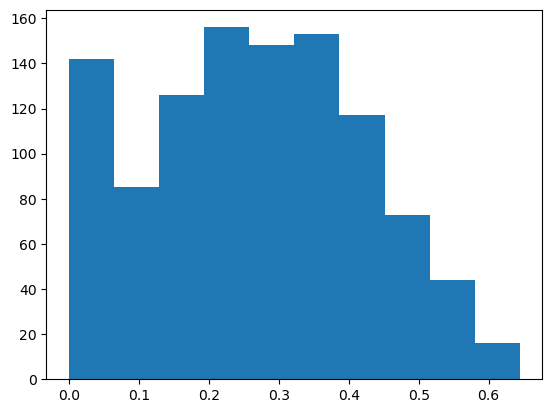

In [46]:
plt.hist(ious[np.where(np.array(dices)>0)])

In [150]:
bad = np.where(np.array(dices)<0.1)
len(bad[0])

203

In [26]:
len(good)

70

In [47]:
len(np.where(np.array(ious)>0.6)[0])

7

In [25]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [72]:
X_files = sorted([os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.startswith('X_')])
good_files = [X_files[xi] for xi in train_indices[np.where(np.array(ious)>0.35)]]

In [74]:
good_files.sort()

In [75]:
good_files

['/home/ayadav7/downscaled_data/X_2018_363_12_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2018_363_6_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_100_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_100_6_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_101_0_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_101_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_101_6_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_102_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_105_0_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_111_0_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_111_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_112_6_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_126_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_126_6_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_127_0_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_128_18_g17.nc.npy',
 '/home/ayadav7/downscaled_data/X_2019_133_12_g17.nc.npy',
 '/hom

/home/ayadav7/downscaled_data/X_2019_197_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


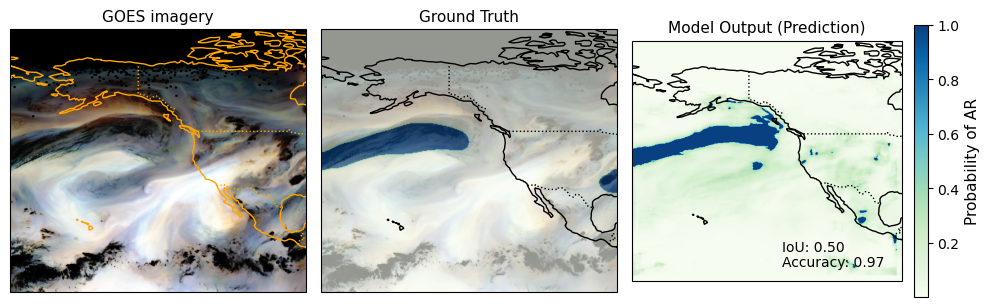

/home/ayadav7/downscaled_data/X_2020_173_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


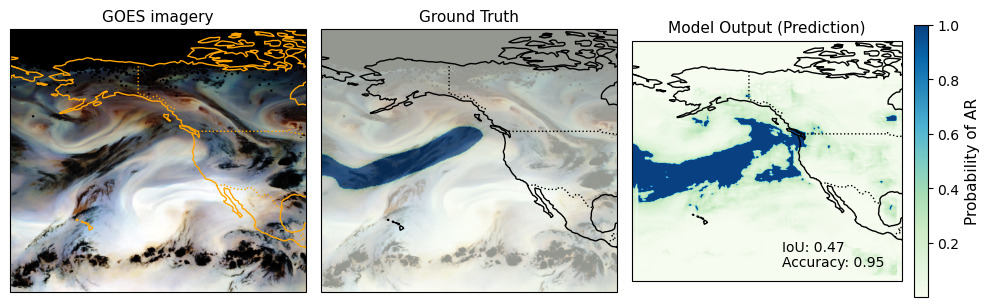

/home/ayadav7/downscaled_data/X_2020_178_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


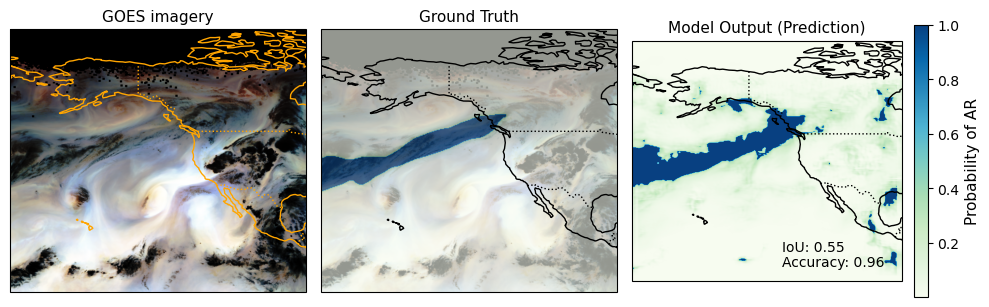

/home/ayadav7/downscaled_data/X_2019_268_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


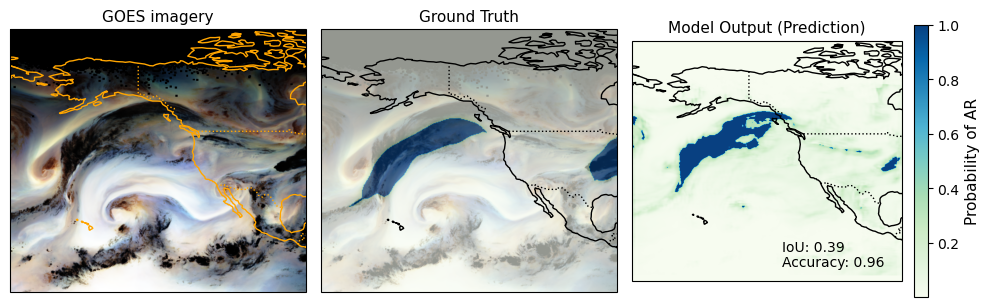

/home/ayadav7/downscaled_data/X_2020_146_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


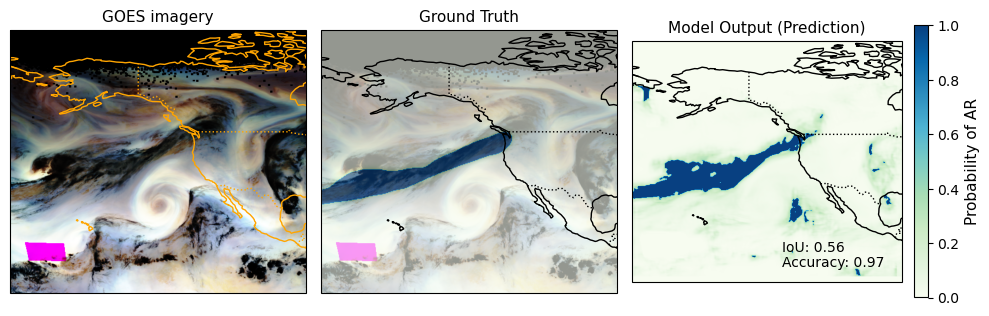

/home/ayadav7/downscaled_data/X_2020_39_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


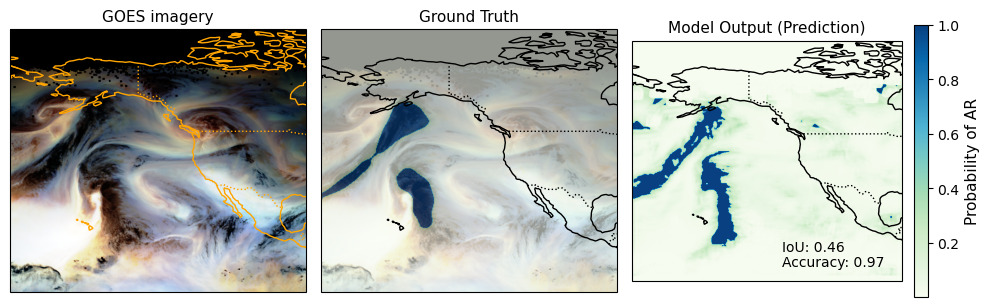

/home/ayadav7/downscaled_data/X_2020_31_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


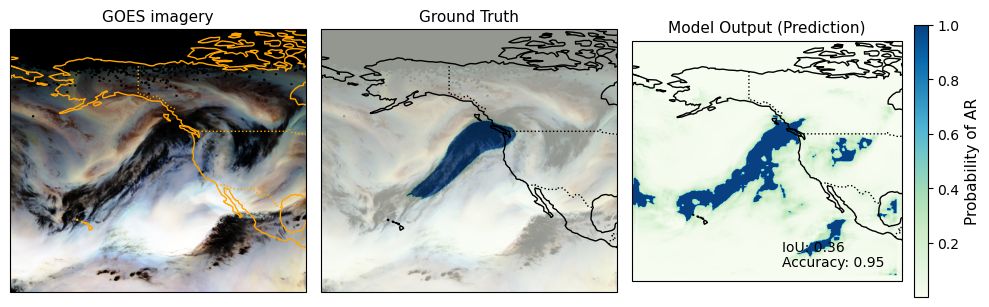

/home/ayadav7/downscaled_data/X_2019_95_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


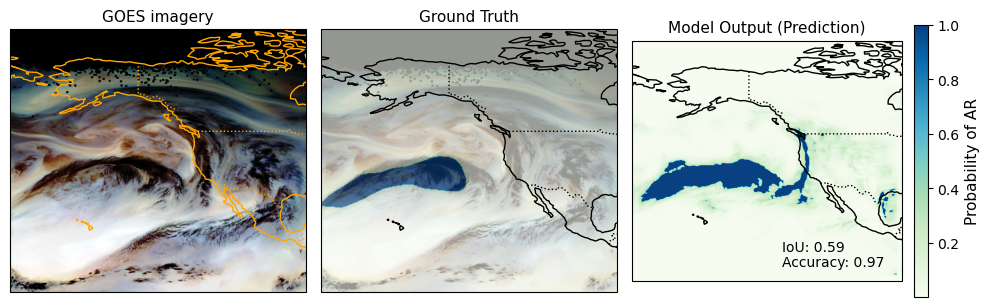

/home/ayadav7/downscaled_data/X_2020_163_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


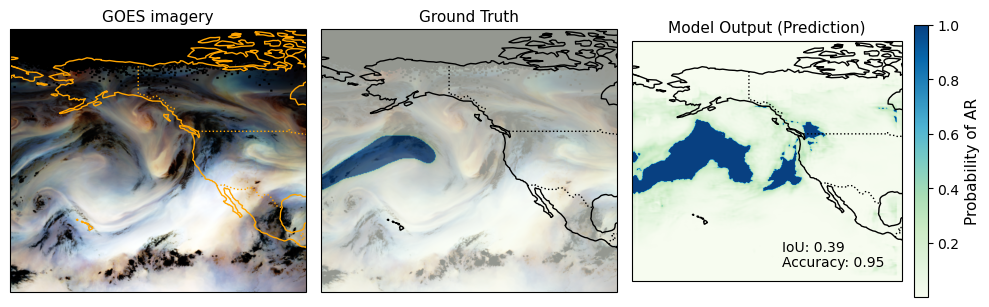

/home/ayadav7/downscaled_data/X_2019_126_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


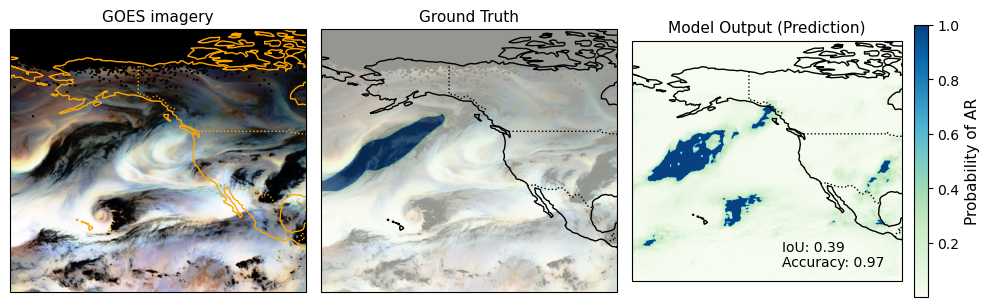

/home/ayadav7/downscaled_data/X_2020_36_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


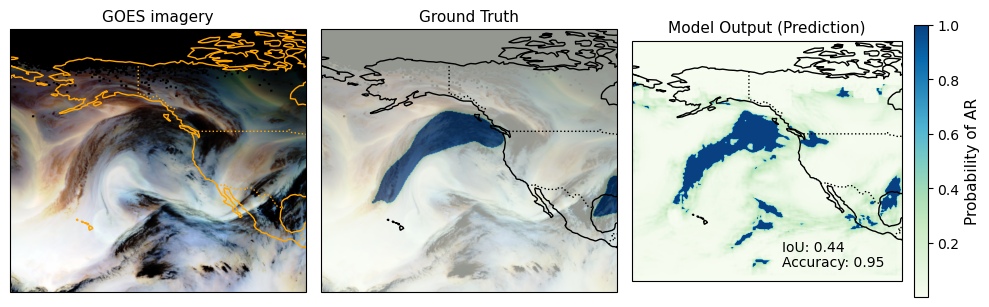

/home/ayadav7/downscaled_data/X_2020_166_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


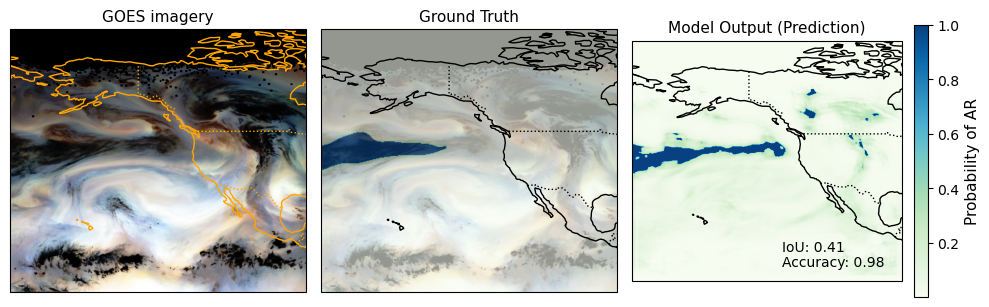

/home/ayadav7/downscaled_data/X_2020_210_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


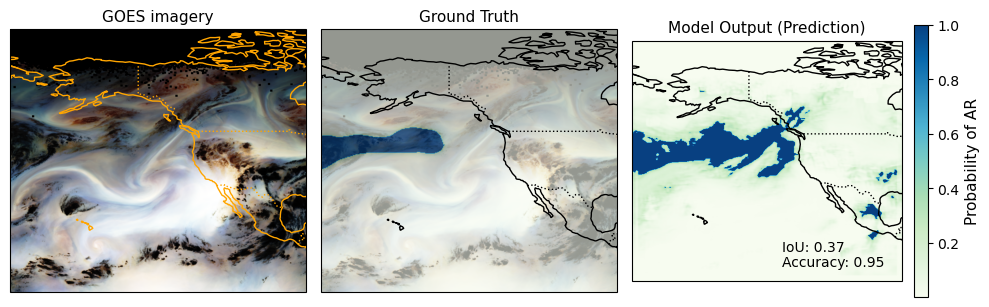

/home/ayadav7/downscaled_data/X_2020_60_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


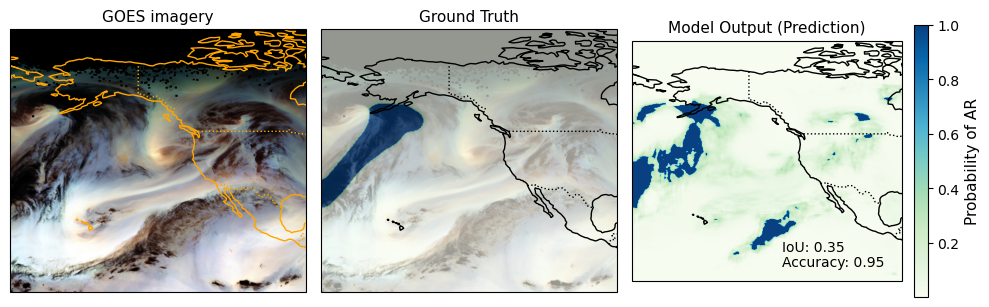

/home/ayadav7/downscaled_data/X_2020_154_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


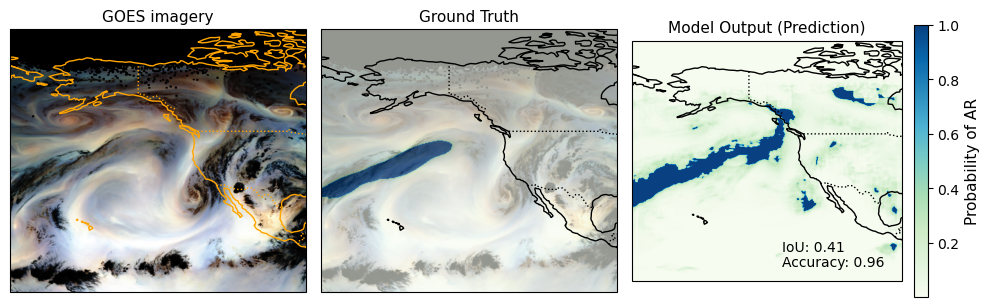

/home/ayadav7/downscaled_data/X_2019_161_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


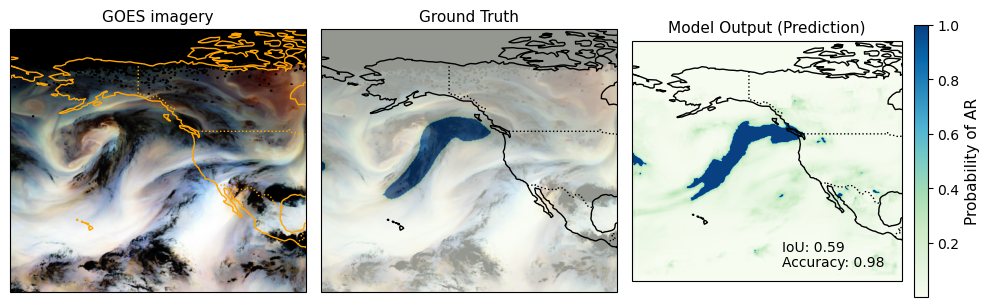

/home/ayadav7/downscaled_data/X_2020_168_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


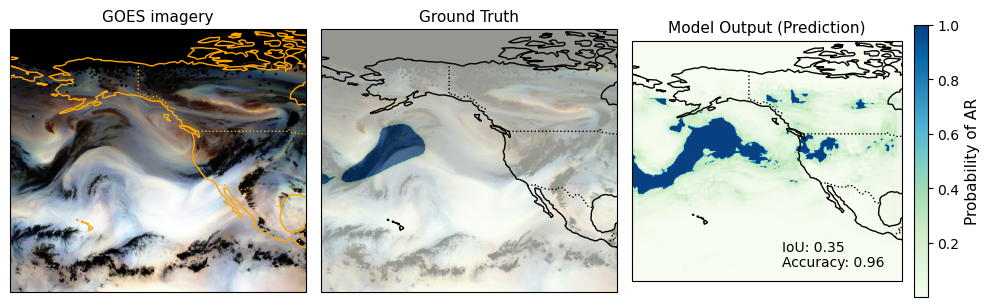

/home/ayadav7/downscaled_data/X_2020_228_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


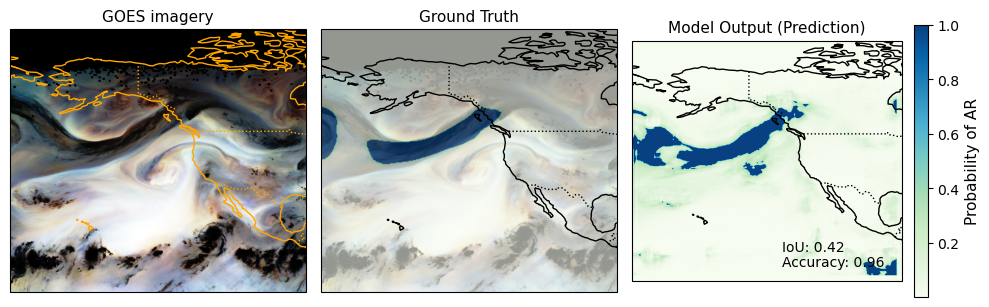

/home/ayadav7/downscaled_data/X_2019_364_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


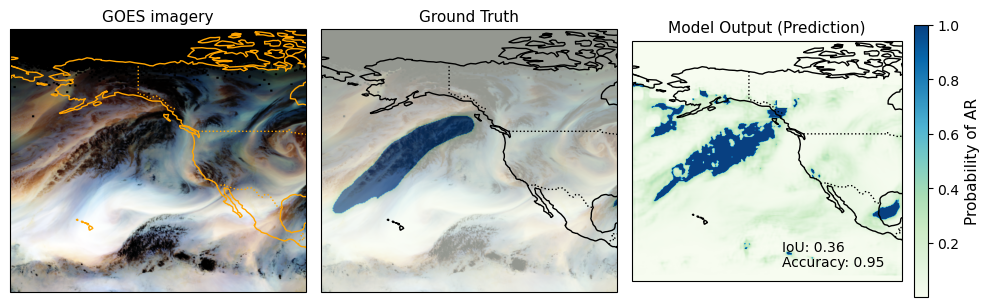

/home/ayadav7/downscaled_data/X_2020_27_18_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


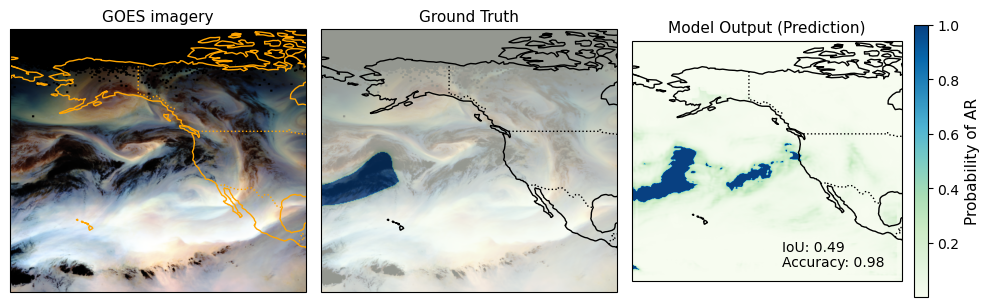

/home/ayadav7/downscaled_data/X_2020_250_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


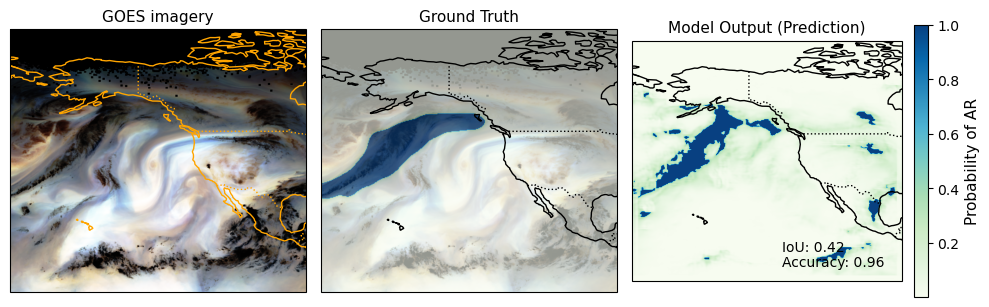

/home/ayadav7/downscaled_data/X_2020_209_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


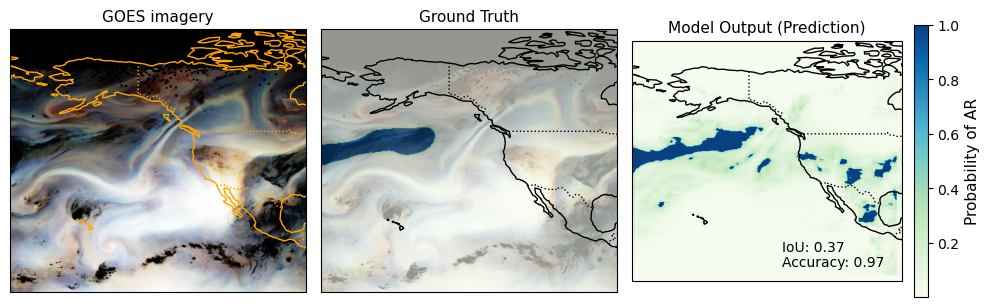

/home/ayadav7/downscaled_data/X_2019_329_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


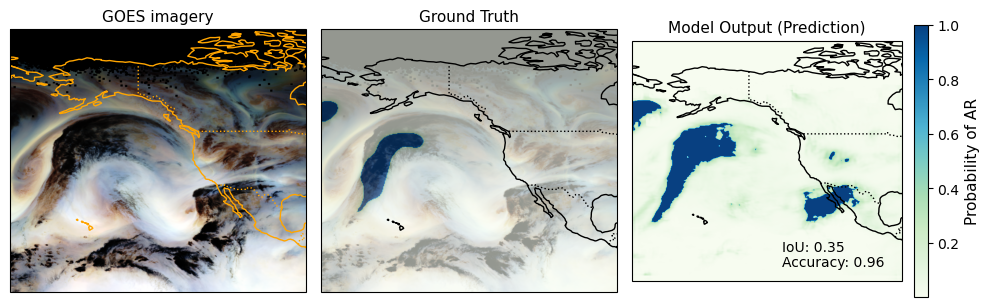

/home/ayadav7/downscaled_data/X_2020_217_0_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


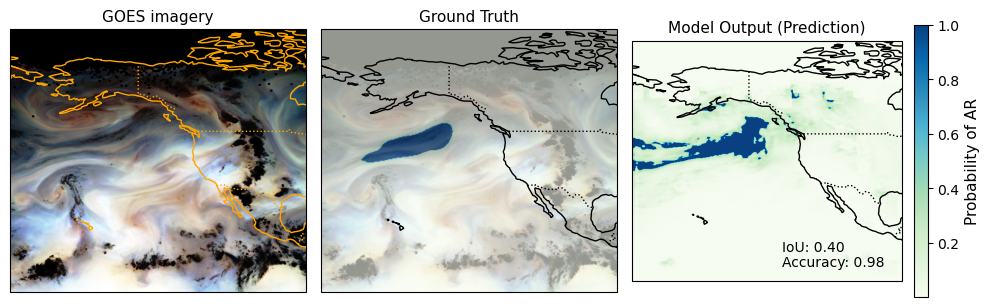

/home/ayadav7/downscaled_data/X_2019_187_6_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


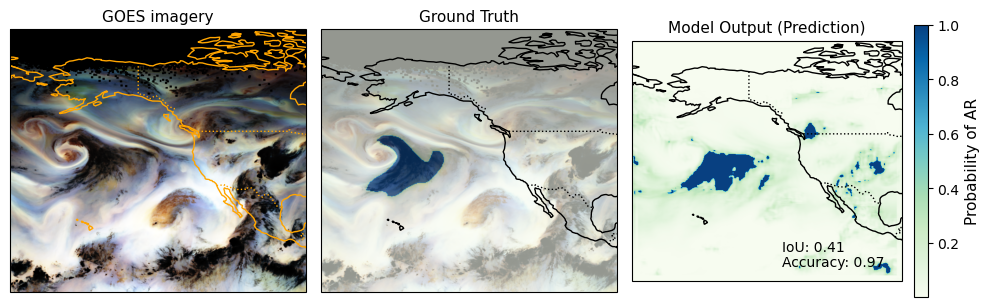

/home/ayadav7/downscaled_data/X_2020_177_12_g17.nc.npy


/home/ayadav7/ayadav7/.conda/envs/ar-goes/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


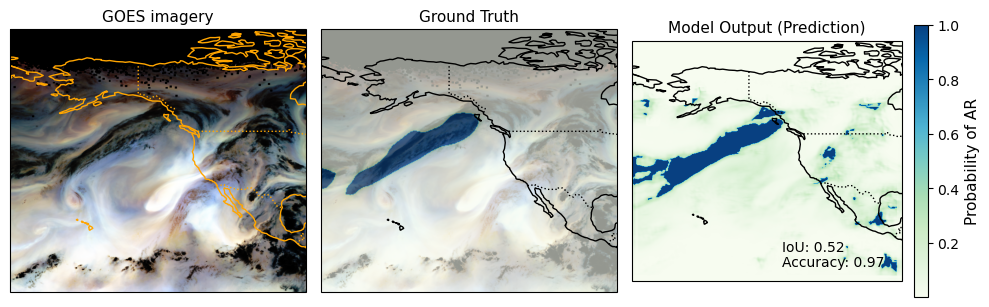

/home/ayadav7/downscaled_data/X_2020_306_6_g17.nc.npy


KeyboardInterrupt: 

In [73]:
k = 0
for i in np.where(np.array(ious)>0.35)[0]:
    
    print(good_files[k])
    k = k + 1
    chex = '#FFA500'
    
    # Select one instance from the training dataset
    sample_X = X_train[i:i+1]  # Taking the first sample (batch size of 1)
    sample_y = y_train[i]    # Corresponding ground truth mask
    
    # Get the model's output for this sample
    gt_filename = os.path.join(predictions_dir, f'prediction_{i}.npy')
    pred = np.load(gt_filename)

    true_mask = binarize_mask(sample_y, threshold=0.5)
    pred_mask = binarize_mask(pred, threshold=0.35)

    precision, recall, f1, iou, accuracy, dice = calculate_metrics(true_mask, pred_mask)

    fig, axs = plt.subplots(1, 3, figsize=(10, 5), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the first band of the input X matrix
    axs[0].set_title("GOES imagery", fontsize=11)
    im1 = axs[0].imshow(histogram_equalization(sample_X[0, :, :, 7:10]), extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='gray')
    axs[0].coastlines(color=chex)
    axs[0].add_feature(cfeature.BORDERS, linestyle=':',color=chex)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    
    # Plot the ground truth y matrix
    axs[1].set_title("Ground Truth", fontsize=11)
    axs[1].imshow(sample_y, extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='GnBu', alpha=1)
    im2 = axs[1].imshow(histogram_equalization(sample_X[0, :, :, 7:10]), extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), alpha=0.4)
    axs[1].coastlines(color='black')
    axs[1].add_feature(cfeature.BORDERS, linestyle=':', color='black')
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    
    pred[0, :, :, 0][pred[0, :, :, 0] > 0.35] = 1
    
    # Plot the predicted output
    axs[2].set_title("Model Output (Prediction)", fontsize=11)
    im3 = axs[2].imshow(pred[0, :, :, 0], extent=[-180, -90, 0, 80], transform=ccrs.PlateCarree(), cmap='GnBu')
    axs[2].text(-130, 10, 'IoU: {:.2f}'.format(iou), transform=ccrs.PlateCarree())
    axs[2].text(-130, 5, 'Accuracy: {:.2f}'.format(accuracy), transform=ccrs.PlateCarree())
    axs[2].coastlines(color='black')
    axs[2].add_feature(cfeature.BORDERS, linestyle=':', color='black')
    axs[2].set_xticks([])
    axs[2].set_yticks([])
    
    # Create a colorbar for the last subplot
    cbar = fig.colorbar(im3, ax=axs[2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label('Probability of AR', fontsize=11)
    cbar.ax.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.show()

In [158]:
pred.shape

(1, 512, 512, 1)

# Train the model

In [36]:
# Define a learning rate scheduler
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

In [28]:
# Train the model with the learning rate scheduler
history = model.fit(train_dataset, epochs=1, validation_data=val_dataset, callbacks=[reduce_lr])

KeyboardInterrupt: 

In [ ]:
# Save the training history
history_dict = history.history
json.dump(history_dict, open('/home/ayadav7/models/training_history.json', 'w'))

# Save the model
model.save('/home/ayadav7/models/unet_model.h5')

In [ ]:
def plot_training_history(history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    
    plt.show()

plot_training_history(history)